In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
import pylab as pl
import seaborn as sns
import numpy as np
from sklearn import preprocessing
from sklearn import ensemble
import warnings
warnings.filterwarnings("ignore")

## 1. Importing Data

In [2]:
df = pd.read_csv("customer_booking.csv", encoding="ISO-8859-1")
df.tail(20)

,num_passengers,sales_channel,trip_type,purchase_lead,length_of_stay,flight_hour,flight_day,route,booking_origin,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,booking_complete
49980,4,Internet,RoundTrip,242,6,9,Tue,PENXIY,Malaysia,1,0,1,5.00,1
49981,1,Internet,RoundTrip,317,6,1,Thu,PENXIY,Malaysia,1,0,1,5.00,0
49982,2,Internet,RoundTrip,177,6,8,Thu,PENXIY,Malaysia,1,1,0,5.00,0
49983,1,Internet,RoundTrip,112,6,17,Tue,PERPNH,Australia,0,0,1,5.62,0
49984,2,Internet,RoundTrip,7,6,4,Wed,PERPNH,Australia,0,0,0,5.62,1
49985,1,Internet,RoundTrip,26,6,13,Wed,PERPNH,Australia,1,1,1,5.62,0
49986,1,Internet,RoundTrip,94,6,19,Sat,PERPNH,Australia,0,0,0,5.62,0
49987,3,Internet,RoundTrip,243,6,12,Fri,PERPNH,Australia,1,0,1,5.62,1
49988,1,Internet,RoundTrip,6,6,14,Thu,PERPNH,Australia,1,1,1,5.62,0
49989,1,Internet,RoundTrip,33,6,2,Sat,PERPNH,Cambodia,1,0,0,5.62,0


In [3]:
df_without_index_header = df.copy()
df_without_index_header.reset_index(drop=True, inplace=True)
df_str = df_without_index_header.to_string(index=False, header=False)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 14 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   num_passengers         50000 non-null  int64  
 1   sales_channel          50000 non-null  object 
 2   trip_type              50000 non-null  object 
 3   purchase_lead          50000 non-null  int64  
 4   length_of_stay         50000 non-null  int64  
 5   flight_hour            50000 non-null  int64  
 6   flight_day             50000 non-null  object 
 7   route                  50000 non-null  object 
 8   booking_origin         50000 non-null  object 
 9   wants_extra_baggage    50000 non-null  int64  
 10  wants_preferred_seat   50000 non-null  int64  
 11  wants_in_flight_meals  50000 non-null  int64  
 12  flight_duration        50000 non-null  float64
 13  booking_complete       50000 non-null  int64  
dtypes: float64(1), int64(8), object(5)
memory usage: 5.3+ 

In [5]:
print(df.columns)

Index(['num_passengers', 'sales_channel', 'trip_type', 'purchase_lead',
       'length_of_stay', 'flight_hour', 'flight_day', 'route',
       'booking_origin', 'wants_extra_baggage', 'wants_preferred_seat',
       'wants_in_flight_meals', 'flight_duration', 'booking_complete'],
      dtype='object')


In [6]:
df.describe()

,num_passengers,purchase_lead,length_of_stay,flight_hour,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,booking_complete
count,50000.000000,50000.000000,50000.00000,50000.00000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000
mean,1.591240,84.940480,23.04456,9.06634,0.668780,0.296960,0.427140,7.277561,0.149560
std,1.020165,90.451378,33.88767,5.41266,0.470657,0.456923,0.494668,1.496863,0.356643
min,1.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,4.670000,0.000000
25%,1.000000,21.000000,5.00000,5.00000,0.000000,0.000000,0.000000,5.620000,0.000000
50%,1.000000,51.000000,17.00000,9.00000,1.000000,0.000000,0.000000,7.570000,0.000000
75%,2.000000,115.000000,28.00000,13.00000,1.000000,1.000000,1.000000,8.830000,0.000000
max,9.000000,867.000000,778.00000,23.00000,1.000000,1.000000,1.000000,9.500000,1.000000


## 2. Data Preparation And Processing

<Axes: xlabel='num_passengers', ylabel='booking_complete'>

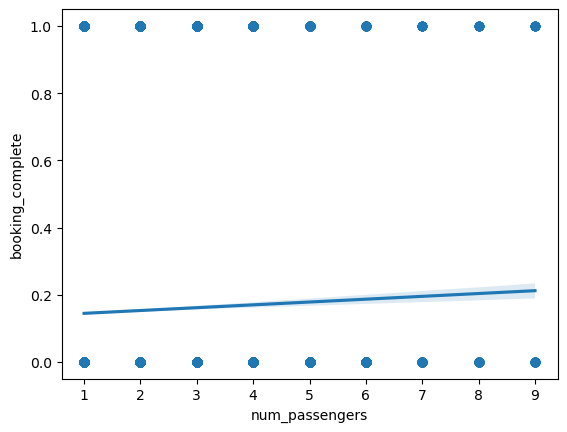

In [7]:
sns.regplot(x="num_passengers", y="booking_complete", data=df)

<Axes: xlabel='length_of_stay', ylabel='booking_complete'>

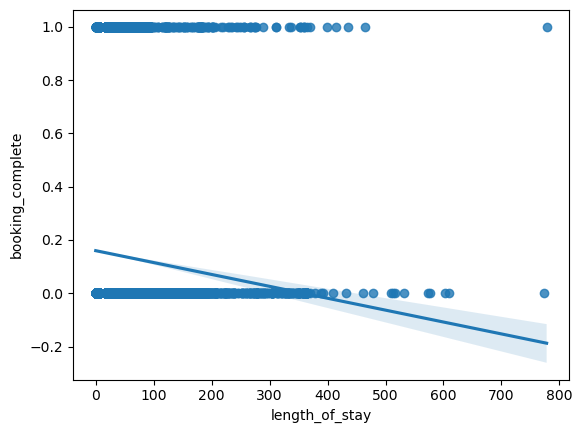

In [8]:
sns.regplot(x="length_of_stay", y="booking_complete", data=df)

<Axes: xlabel='purchase_lead', ylabel='booking_complete'>

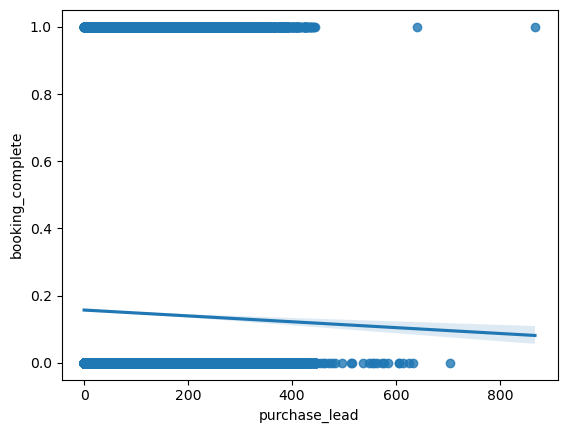

In [9]:
sns.regplot(x="purchase_lead", y="booking_complete", data=df)

### Feature Transformation

In [10]:
Features= df[['num_passengers', 'sales_channel', 'trip_type', 'purchase_lead',
       'length_of_stay', 'flight_day', 'wants_extra_baggage', 'wants_preferred_seat',
       'wants_in_flight_meals', 'flight_duration']].values
Features[0:5]

array([[2, 'Internet', 'RoundTrip', 262, 19, 'Sat', 1, 0, 0, 5.52],
       [1, 'Internet', 'RoundTrip', 112, 20, 'Sat', 0, 0, 0, 5.52],
       [2, 'Internet', 'RoundTrip', 243, 22, 'Wed', 1, 1, 0, 5.52],
       [1, 'Internet', 'RoundTrip', 96, 31, 'Sat', 0, 0, 1, 5.52],
       [2, 'Internet', 'RoundTrip', 68, 22, 'Wed', 1, 0, 1, 5.52]],
      dtype=object)

In [11]:
df.head(10)

,num_passengers,sales_channel,trip_type,purchase_lead,length_of_stay,flight_hour,flight_day,route,booking_origin,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,booking_complete
0,2,Internet,RoundTrip,262,19,7,Sat,AKLDEL,New Zealand,1,0,0,5.52,0
1,1,Internet,RoundTrip,112,20,3,Sat,AKLDEL,New Zealand,0,0,0,5.52,0
2,2,Internet,RoundTrip,243,22,17,Wed,AKLDEL,India,1,1,0,5.52,0
3,1,Internet,RoundTrip,96,31,4,Sat,AKLDEL,New Zealand,0,0,1,5.52,0
4,2,Internet,RoundTrip,68,22,15,Wed,AKLDEL,India,1,0,1,5.52,0
5,1,Internet,RoundTrip,3,48,20,Thu,AKLDEL,New Zealand,1,0,1,5.52,0
6,3,Internet,RoundTrip,201,33,6,Thu,AKLDEL,New Zealand,1,0,1,5.52,0
7,2,Internet,RoundTrip,238,19,14,Mon,AKLDEL,India,1,0,1,5.52,0
8,1,Internet,RoundTrip,80,22,4,Mon,AKLDEL,New Zealand,0,0,1,5.52,0
9,1,Mobile,RoundTrip,378,30,12,Sun,AKLDEL,India,0,0,0,5.52,0


In [12]:
 df['sales_channel'].unique()

array(['Internet', 'Mobile'], dtype=object)

In [13]:
df['num_passengers'].unique()

array([2, 1, 3, 4, 6, 5, 7, 9, 8])

In [14]:
 df['trip_type'].unique()

array(['RoundTrip', 'CircleTrip', 'OneWay'], dtype=object)

In [15]:
 df['flight_day'].unique()

array(['Sat', 'Wed', 'Thu', 'Mon', 'Sun', 'Tue', 'Fri'], dtype=object)

In [16]:
from sklearn.preprocessing import OneHotEncoder

ohe=OneHotEncoder()
ohe.fit_transform(df[['sales_channel','trip_type','flight_day']]).toarray()

array([[1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 1.],
       ...,
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 1., 0., 0.]])

In [17]:
df_final=df
df_final

,num_passengers,sales_channel,trip_type,purchase_lead,length_of_stay,flight_hour,flight_day,route,booking_origin,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,booking_complete
0,2,Internet,RoundTrip,262,19,7,Sat,AKLDEL,New Zealand,1,0,0,5.52,0
1,1,Internet,RoundTrip,112,20,3,Sat,AKLDEL,New Zealand,0,0,0,5.52,0
2,2,Internet,RoundTrip,243,22,17,Wed,AKLDEL,India,1,1,0,5.52,0
3,1,Internet,RoundTrip,96,31,4,Sat,AKLDEL,New Zealand,0,0,1,5.52,0
4,2,Internet,RoundTrip,68,22,15,Wed,AKLDEL,India,1,0,1,5.52,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,2,Internet,RoundTrip,27,6,9,Sat,PERPNH,Australia,1,0,1,5.62,0
49996,1,Internet,RoundTrip,111,6,4,Sun,PERPNH,Australia,0,0,0,5.62,0
49997,1,Internet,RoundTrip,24,6,22,Sat,PERPNH,Australia,0,0,1,5.62,0
49998,1,Internet,RoundTrip,15,6,11,Mon,PERPNH,Australia,1,0,1,5.62,0


In [18]:
feature_arry=ohe.fit_transform(df_final[['sales_channel','trip_type','flight_day']]).toarray()
ohe.categories_

[array(['Internet', 'Mobile'], dtype=object),
 array(['CircleTrip', 'OneWay', 'RoundTrip'], dtype=object),
 array(['Fri', 'Mon', 'Sat', 'Sun', 'Thu', 'Tue', 'Wed'], dtype=object)]

In [19]:
feature_df = pd.DataFrame(feature_arry, columns=ohe.get_feature_names_out(['sales_channel','trip_type','flight_day']))
feature_df

,sales_channel_Internet,sales_channel_Mobile,trip_type_CircleTrip,trip_type_OneWay,trip_type_RoundTrip,flight_day_Fri,flight_day_Mon,flight_day_Sat,flight_day_Sun,flight_day_Thu,flight_day_Tue,flight_day_Wed
0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
49995,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
49996,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
49997,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
49998,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [20]:
feature_df.describe()

,sales_channel_Internet,sales_channel_Mobile,trip_type_CircleTrip,trip_type_OneWay,trip_type_RoundTrip,flight_day_Fri,flight_day_Mon,flight_day_Sat,flight_day_Sun,flight_day_Thu,flight_day_Tue,flight_day_Wed
count,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000
mean,0.887640,0.112360,0.002320,0.007740,0.989940,0.135220,0.162040,0.116240,0.131080,0.148480,0.153460,0.153480
std,0.315812,0.315812,0.048111,0.087637,0.099795,0.341962,0.368491,0.320516,0.337491,0.355579,0.360434,0.360453
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [21]:
df_final = df_final.drop(['sales_channel','trip_type','flight_day','route','booking_origin'], axis=1)
df_final

,num_passengers,purchase_lead,length_of_stay,flight_hour,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,booking_complete
0,2,262,19,7,1,0,0,5.52,0
1,1,112,20,3,0,0,0,5.52,0
2,2,243,22,17,1,1,0,5.52,0
3,1,96,31,4,0,0,1,5.52,0
4,2,68,22,15,1,0,1,5.52,0
...,...,...,...,...,...,...,...,...,...
49995,2,27,6,9,1,0,1,5.62,0
49996,1,111,6,4,0,0,0,5.62,0
49997,1,24,6,22,0,0,1,5.62,0
49998,1,15,6,11,1,0,1,5.62,0


In [22]:
df_final = pd.get_dummies(df_final, columns=['num_passengers'])

In [23]:
df_final.rename(columns={'booking_complete': 'label'}, inplace=True)

In [24]:
df_final= pd.concat([df_final, feature_df], axis=1)
df_final

,purchase_lead,length_of_stay,flight_hour,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,label,num_passengers_1,num_passengers_2,...,trip_type_CircleTrip,trip_type_OneWay,trip_type_RoundTrip,flight_day_Fri,flight_day_Mon,flight_day_Sat,flight_day_Sun,flight_day_Thu,flight_day_Tue,flight_day_Wed
0,262,19,7,1,0,0,5.52,0,False,True,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
1,112,20,3,0,0,0,5.52,0,True,False,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,243,22,17,1,1,0,5.52,0,False,True,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,96,31,4,0,0,1,5.52,0,True,False,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
4,68,22,15,1,0,1,5.52,0,False,True,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49995,27,6,9,1,0,1,5.62,0,False,True,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
49996,111,6,4,0,0,0,5.62,0,True,False,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
49997,24,6,22,0,0,1,5.62,0,True,False,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
49998,15,6,11,1,0,1,5.62,0,True,False,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [25]:
df_final.describe()

,purchase_lead,length_of_stay,flight_hour,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,label,sales_channel_Internet,sales_channel_Mobile,trip_type_CircleTrip,trip_type_OneWay,trip_type_RoundTrip,flight_day_Fri,flight_day_Mon,flight_day_Sat,flight_day_Sun,flight_day_Thu,flight_day_Tue,flight_day_Wed
count,50000.000000,50000.00000,50000.00000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000
mean,84.940480,23.04456,9.06634,0.668780,0.296960,0.427140,7.277561,0.149560,0.887640,0.112360,0.002320,0.007740,0.989940,0.135220,0.162040,0.116240,0.131080,0.148480,0.153460,0.153480
std,90.451378,33.88767,5.41266,0.470657,0.456923,0.494668,1.496863,0.356643,0.315812,0.315812,0.048111,0.087637,0.099795,0.341962,0.368491,0.320516,0.337491,0.355579,0.360434,0.360453
min,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,4.670000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,21.000000,5.00000,5.00000,0.000000,0.000000,0.000000,5.620000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,51.000000,17.00000,9.00000,1.000000,0.000000,0.000000,7.570000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,115.000000,28.00000,13.00000,1.000000,1.000000,1.000000,8.830000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,867.000000,778.00000,23.00000,1.000000,1.000000,1.000000,9.500000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


#### Reviewing Booking Probabilty from Total Data

In [26]:
label=df[['booking_complete']]

In [27]:

ohe=OneHotEncoder()
features_arry=ohe.fit_transform(df[['booking_complete']]).toarray()
booking_complete = pd.DataFrame(features_arry, columns=ohe.get_feature_names_out(['booking_complete']))

booking_complete

,booking_complete_0,booking_complete_1
0,1.0,0.0
1,1.0,0.0
2,1.0,0.0
3,1.0,0.0
4,1.0,0.0
...,...,...
49995,1.0,0.0
49996,1.0,0.0
49997,1.0,0.0
49998,1.0,0.0


In [28]:
zeros_count = (df['booking_complete'] == 0).sum()
ones_count = (df['booking_complete'] == 1).sum()
print(f'Total number of zeros in the "booking_complete" column: {zeros_count}')
print(f'Total number of ones in the "booking_complete" column: {ones_count}')

Total number of zeros in the "booking_complete" column: 42522
Total number of ones in the "booking_complete" column: 7478


In [29]:
Booking=booking_complete.transpose()
Booking

,0,1,2,3,4,5,6,7,8,9,...,49990,49991,49992,49993,49994,49995,49996,49997,49998,49999
booking_complete_0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
booking_complete_1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [30]:
Booking['total']='42522','7478'
Booking

,0,1,2,3,4,5,6,7,8,9,...,49991,49992,49993,49994,49995,49996,49997,49998,49999,total
booking_complete_0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,42522
booking_complete_1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7478


In [31]:
import plotly.graph_objects as go

plot_data=[
    go.Pie(
        labels=Booking.index,
        values=Booking['total'],
        marker=dict(colors=["Red","Green"],
                      line=dict(color="white",
                                width=1.5)),
        
        rotation=90,
        hoverinfo= 'label+value+text',
        hole=.6)
]   


plot_layout = go.Layout(dict(title='Churn Possibility'))

fig = go.Figure(data=plot_data, layout=plot_layout)


fig.show()


Completed bookings were 15% of the data

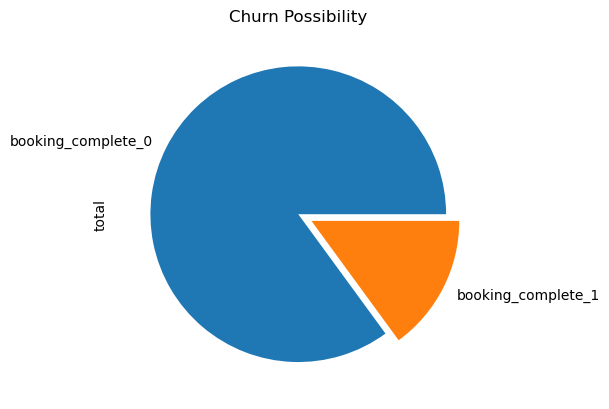

In [32]:
Booking['total'] = pd.to_numeric(Booking['total'], errors='coerce')


booking_complete_1 = [0, 0.1]
Booking['total'].plot(kind='pie', explode=booking_complete_1)
plt.title('Churn Possibility')
plt.show()

In [33]:
df_final = df_final[[col for col in df_final.columns if col != 'label'] + ['label']]

#### purchase_lead, length_of_stay, flight_hour and flight_duration show some level of Skewness

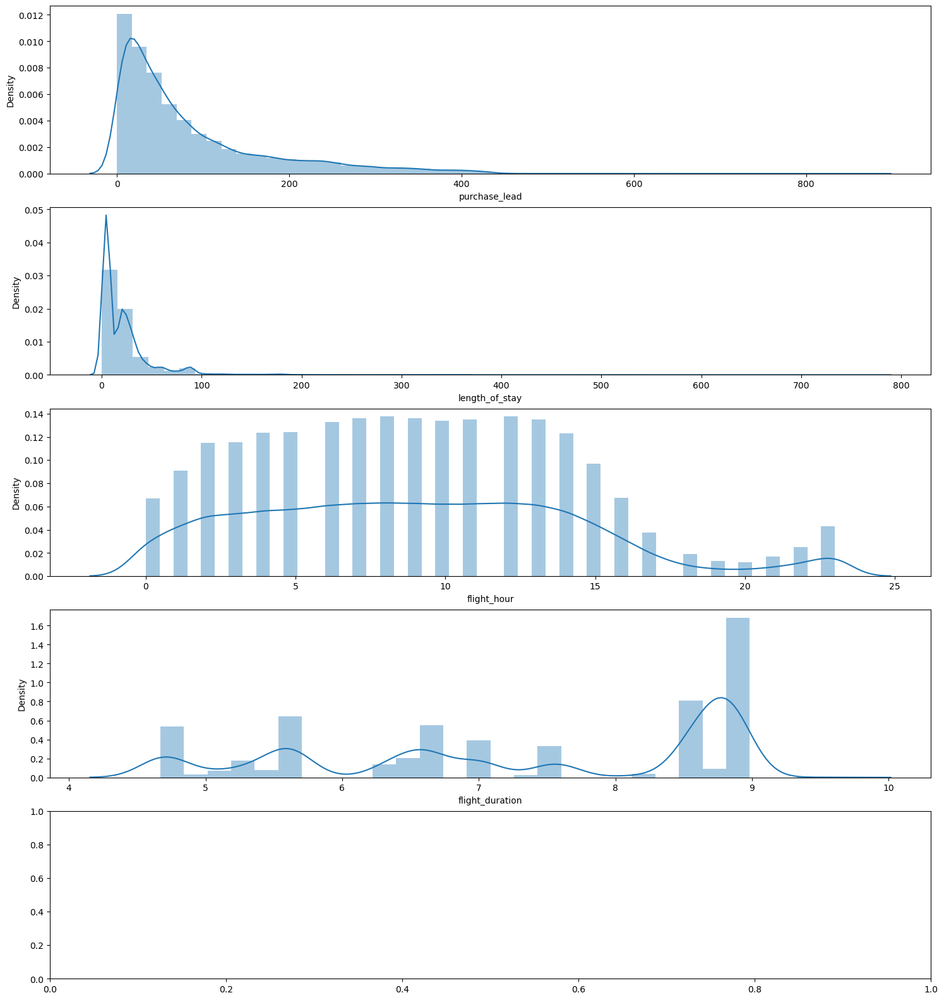

In [34]:
fig, axs = plt.subplots(nrows=5, figsize=(18, 20))
# Plot histograms
sns.distplot((df_final["purchase_lead"].dropna()), ax=axs[0]) 
sns.distplot((df_final["length_of_stay"].dropna()), ax=axs[1]),
sns.distplot((df_final["flight_hour"].dropna()), ax=axs[2]) 
sns.distplot((df_final["flight_duration"].dropna()), ax=axs[3])  
plt.show()

### Correcting skewness In Data

In [35]:
df_final["purchase_lead"] = np.log10(df_final["purchase_lead"] + 1) 
df_final["length_of_stay"] = np.log10(df_final["length_of_stay"]+ 1) 
df_final["flight_hour"] = np.log10(df_final["flight_hour"] + 1)
df_final["flight_duration"] = np.log10(df_final["flight_duration"] + 1)


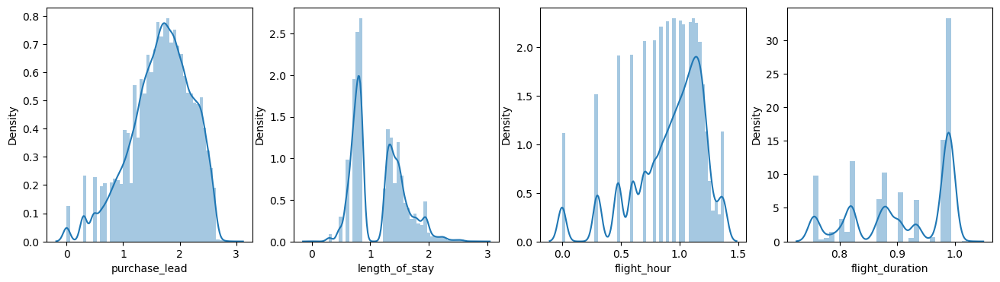

In [36]:
fig, axs = plt.subplots(1, 4, figsize=(16, 4))
sns.distplot((df_final["purchase_lead"].dropna()), ax=axs[0]) 
sns.distplot((df_final["length_of_stay"].dropna()), ax=axs[1]),
sns.distplot((df_final["flight_hour"].dropna()), ax=axs[2]) 
sns.distplot((df_final["flight_duration"].dropna()), ax=axs[3])
 
plt.show()

### Review of Outliers

In [37]:
df_final.describe()

,purchase_lead,length_of_stay,flight_hour,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,sales_channel_Internet,sales_channel_Mobile,trip_type_CircleTrip,trip_type_OneWay,trip_type_RoundTrip,flight_day_Fri,flight_day_Mon,flight_day_Sat,flight_day_Sun,flight_day_Thu,flight_day_Tue,flight_day_Wed,label
count,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000
mean,1.671739,1.141818,0.917859,0.668780,0.296960,0.427140,0.910269,0.887640,0.112360,0.002320,0.007740,0.989940,0.135220,0.162040,0.116240,0.131080,0.148480,0.153460,0.153480,0.149560
std,0.535219,0.436632,0.305857,0.470657,0.456923,0.494668,0.082934,0.315812,0.315812,0.048111,0.087637,0.099795,0.341962,0.368491,0.320516,0.337491,0.355579,0.360434,0.360453,0.356643
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.753583,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.342423,0.778151,0.778151,0.000000,0.000000,0.000000,0.820858,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.716003,1.255273,1.000000,1.000000,0.000000,0.000000,0.932981,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,2.064458,1.462398,1.146128,1.000000,1.000000,1.000000,0.992554,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,2.938520,2.891537,1.380211,1.000000,1.000000,1.000000,1.021189,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [38]:
import plotly.express as px
fig1=px.box(df_final, 'purchase_lead') 
fig2=px.box(df_final, 'length_of_stay') 
fig3=px.box(df_final, 'flight_hour') 
fig4=px.box(df_final, 'flight_duration')
fig1.show() 
fig2.show() 
fig3.show() 
fig4.show()


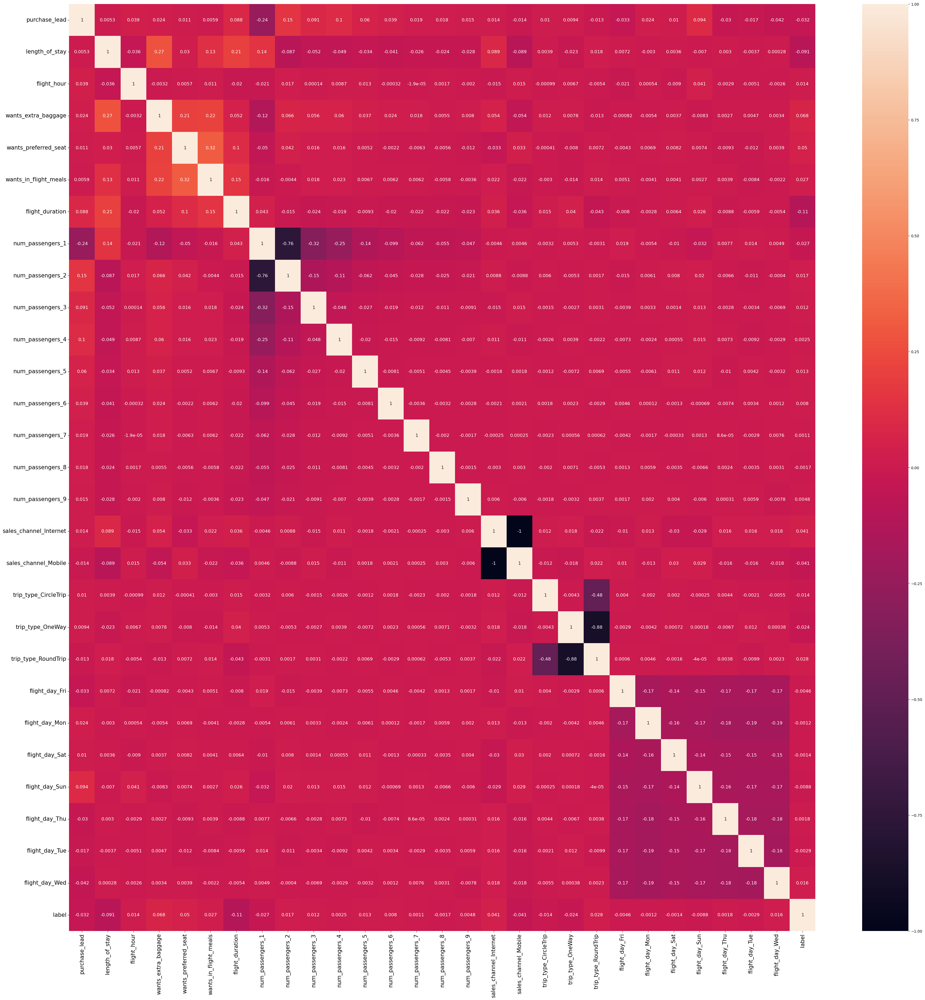

In [39]:

correlation = df_final.corr()
plt.figure(figsize=(45, 45))
sns.heatmap(correlation, xticklabels=correlation.columns.values, yticklabels=correlation.columns.values, annot=True,
annot_kws={'size': 12}
)

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()

In [40]:
X =df_final.drop('label', axis=1)
Y=df_final['label']

In [41]:
from sklearn.model_selection import train_test_split

X_train, X_tests, Y_train, Y_tests = train_test_split(X, Y, test_size=0.2, random_state=42, stratify=Y)


In [42]:
from sklearn.metrics import accuracy_score

In [43]:
print ('Train set:', X_train.shape,  Y_train.shape)
print ('Test set:', X_tests.shape,  Y_tests.shape) 

Train set: (40000, 28) (40000,)
Test set: (10000, 28) (10000,)


In [44]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

In [45]:
models=[LogisticRegression(), SVC(kernel='linear'),RandomForestClassifier()]

In [46]:
def compare_models_train_test():
    for model in models:
        model.fit(X_train, Y_train)
        test_data_prediction=model.predict(X_tests)
        accuracy=accuracy_score(Y_tests, test_data_prediction)
        
        print('Accuracy score of the ',model,'=',accuracy)

In [47]:
compare_models_train_test()

Accuracy score of the  LogisticRegression() = 0.8504
Accuracy score of the  SVC(kernel='linear') = 0.8504
Accuracy score of the  RandomForestClassifier() = 0.8479


In [48]:
from sklearn.model_selection import cross_val_score

In [49]:
cv_score_lr=cross_val_score(LogisticRegression(max_iter=1000), X,Y,cv=5)
print('cv_score_lr=',cv_score_lr)

mean_accuracy_lr=sum(cv_score_lr)/len(cv_score_lr)
print('mean_accuracy_lr=',round(mean_accuracy_lr,2))

cv_score_lr= [0.8505 0.8505 0.8504 0.8503 0.8504]
mean_accuracy_lr= 0.85


In [50]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import classification_report, accuracy_score
from sklearn.inspection import permutation_importance

from yellowbrick.classifier import ConfusionMatrix
from sklearn.model_selection import GridSearchCV, RepeatedStratifiedKFold

In [51]:
def model_fit_predict(model, X, Y, X_predict):
    model.fit(X,Y)
    return model.predict(X_predict)
def acc_score(Y_true, Y_pred):
    return accuracy_score(Y_true, Y_pred)
def pre_score(Y_true,Y_pred):
    return precision_score(Y_true, Y_pred)
def f_score(Y_true, Y_pred):
    return f1_score(Y_true, Y_pred)

In [52]:
from sklearn.model_selection import train_test_split
X =df_final.drop('label', axis=1)
Y=df_final['label']
X_train, X_tests, Y_train, Y_tests = train_test_split(X, Y,test_size=0.2,  stratify=Y)
print ('Train set:', X_train.shape,  Y_train.shape)
print ('Test set:', X_tests.shape,  Y_tests.shape)

Train set: (40000, 28) (40000,)
Test set: (10000, 28) (10000,)


In [53]:

model1 = RandomForestClassifier()

Y_pred_test = model_fit_predict(model1, X_train, Y_train, X_tests)


f1 = round(f1_score(Y_tests, Y_pred_test),2) 


acc = round(accuracy_score(Y_tests, Y_pred_test),2) 


pre = round(precision_score(Y_tests, Y_pred_test),2) 

print(f"Accuracy, precision and f1-score for training data are {acc}, {pre} and {f1} respectively")

Accuracy, precision and f1-score for training data are 0.85, 0.38 and 0.1 respectively


In [54]:
from sklearn import metrics
predictions1 = model1.predict(X_tests)
tn, fp, fn, tp = metrics.confusion_matrix(Y_tests, predictions1).ravel()
Y_tests.value_counts()


print(f"True positives: {tp}") 
print(f"False positives: {fp}") 
print(f"True negatives: {tn}") 
print(f"False negatives: {fn}\n")

print(f"Accuracy: {metrics.accuracy_score(Y_tests, predictions1)}") 
print(f"Precision: {metrics.precision_score(Y_tests, predictions1)}") 
print(f"Recall: {metrics.recall_score(Y_tests, predictions1)}")

True positives: 83
False positives: 134
True negatives: 8370
False negatives: 1413

Accuracy: 0.8453
Precision: 0.3824884792626728
Recall: 0.05548128342245989


0.9996

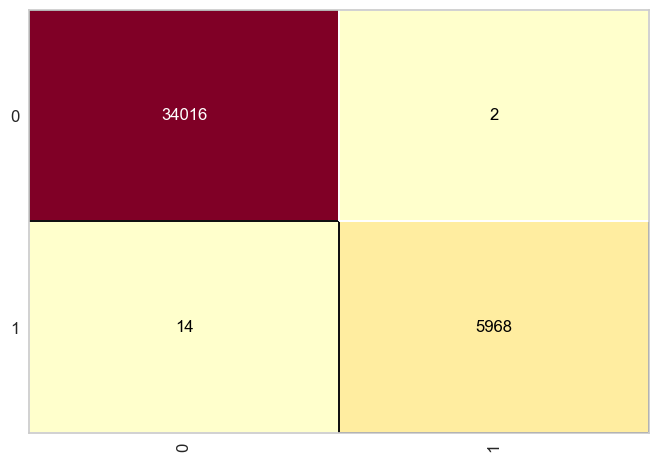

In [55]:
cm= ConfusionMatrix(model1, classes=[0,1])
cm.fit(X_train, Y_train)

cm.score(X_train, Y_train)

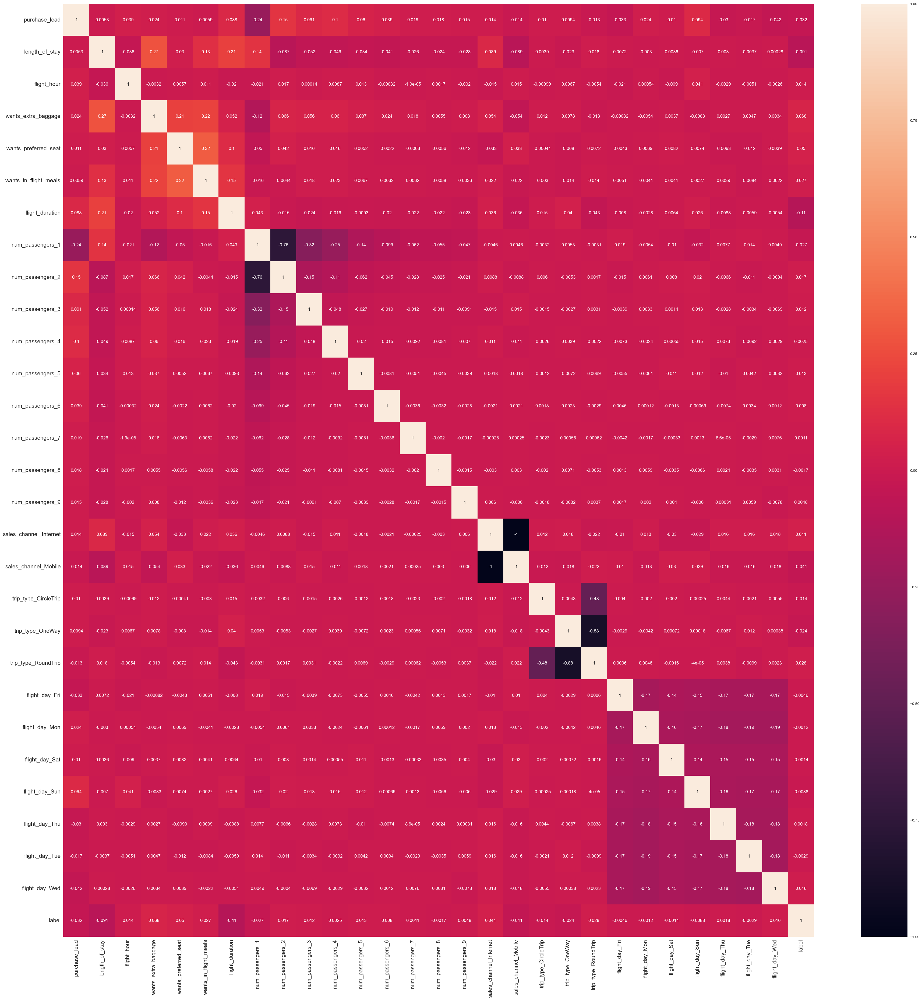

In [56]:
correlation = df_final.corr()
plt.figure(figsize=(45, 45))
sns.heatmap(
correlation, xticklabels=correlation.columns.values, yticklabels=correlation.columns.values, annot=True,
annot_kws={'size': 12}
)

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()

In [57]:
def correlation (dataset, threshold):
    col_corr = set() 
    corr_matrix = dataset.corr()
    for i in range (len (corr_matrix.columns)) :
        for j in range(i):
            if abs (corr_matrix.iloc [i, j]) > threshold: 
                colname = corr_matrix.columns [i] 
                col_corr.add(colname)
    return col_corr

In [58]:
corr_features=correlation(X_train, 0.85)
len(set(corr_features))

2

In [59]:
corr_features

{'sales_channel_Mobile', 'trip_type_RoundTrip'}

In [60]:
feature_importances = pd.DataFrame({'features': X_train.columns,'importance': model1.feature_importances_}).sort_values(by='importance', ascending=True).reset_index()

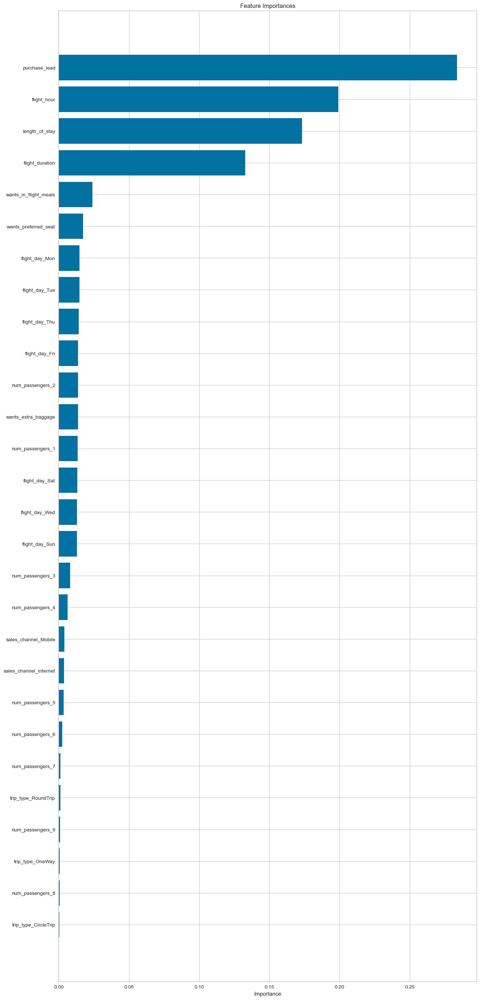

In [61]:
plt.figure(figsize=(15, 35))
plt.title('Feature Importances')
plt.barh(range(len(feature_importances)), feature_importances['importance'],color='b', align='center')
plt.yticks(range(len(feature_importances)), feature_importances['features']) 
plt.xlabel('Importance')
plt.show()

In [62]:
features_to_drop=['sales_channel_Mobile', 'trip_type_RoundTrip']
model_df=df_final.drop(columns=features_to_drop,axis=1)
model_df.head(5)

,purchase_lead,length_of_stay,flight_hour,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,num_passengers_1,num_passengers_2,num_passengers_3,...,trip_type_CircleTrip,trip_type_OneWay,flight_day_Fri,flight_day_Mon,flight_day_Sat,flight_day_Sun,flight_day_Thu,flight_day_Tue,flight_day_Wed,label
0,2.419956,1.301030,0.903090,1,0,0,0.814248,False,True,False,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0
1,2.053078,1.322219,0.602060,0,0,0,0.814248,True,False,False,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0
2,2.387390,1.361728,1.255273,1,1,0,0.814248,False,True,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0
3,1.986772,1.505150,0.698970,0,0,1,0.814248,True,False,False,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0
4,1.838849,1.361728,1.204120,1,0,1,0.814248,False,True,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0


In [63]:
X =model_df.drop('label', axis=1)
Y=model_df['label']
X_train, X_tests, Y_train, Y_tests = train_test_split(X, Y, test_size=0.2, random_state=42, stratify=Y)
print ('Train set:', X_train.shape,  Y_train.shape)
print ('Test set:', X_tests.shape,  Y_tests.shape)

Train set: (40000, 26) (40000,)
Test set: (10000, 26) (10000,)


In [64]:
#create an instance of the classifier and fit the training data
model2 = RandomForestClassifier()
Y_pred_test = model_fit_predict(model2, X_train, Y_train, X_tests)

#f1 score for training data
f1 = round(f1_score(Y_tests, Y_pred_test),3) 

#accuracy score for training data
acc = round(accuracy_score(Y_tests, Y_pred_test),3) 

recall=round(recall_score(Y_tests, Y_pred_test, pos_label=0),3) 


#precision score for training data
pre = round(precision_score(Y_tests, Y_pred_test),3) 

print(f"Accuracy, precision, recall and f1-score for training data are {acc}, {pre},{recall} and {f1} respectively")

Accuracy, precision, recall and f1-score for training data are 0.847, 0.406,0.987 and 0.092 respectively


In [65]:
from sklearn import metrics

predictions2 = model2.predict(X_tests)
tn, fp, fn, tp = metrics.confusion_matrix(Y_tests, predictions2).ravel()
Y_tests.value_counts()


print(f"True positives: {tp}") 
print(f"False positives: {fp}") 
print(f"True negatives: {tn}") 
print(f"False negatives: {fn}\n")

print(f"Accuracy: {metrics.accuracy_score(Y_tests, predictions2)}") 
print(f"Precision: {metrics.precision_score(Y_tests, predictions2)}") 
print(f"Recall: {metrics.recall_score(Y_tests, predictions2)}")

True positives: 78
False positives: 114
True negatives: 8390
False negatives: 1418

Accuracy: 0.8468
Precision: 0.40625
Recall: 0.05213903743315508


In [66]:
import numpy as np

max_features_range = np.arange(1,29,1)
n_estimators_range=np.arange(100,500,100)
param_grid=dict(max_features=max_features_range, n_estimators=n_estimators_range)

rf=RandomForestClassifier()
grid=GridSearchCV(estimator=rf, param_grid=param_grid, cv=5 , n_jobs=-1)

In [67]:
from sklearn.model_selection import GridSearchCV

In [68]:
from sklearn.model_selection import GridSearchCV
classifier = ensemble.RandomForestClassifier(n_jobs=-1)
param_grid= {
    'n_estimators':[100,500,1000],
    'max_depth':[1,3,7,10],
    'criterion':["gini","entropy"],

}

model=GridSearchCV(
    estimator=classifier,
    param_grid=param_grid,
    scoring="accuracy",
    verbose=10,
    n_jobs=-1,
    cv=5,
)

model.fit(X_train,Y_train)
print(model.best_score_)
print(model.best_estimator_.get_params())

Fitting 5 folds for each of 24 candidates, totalling 120 fits
0.850475
{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'gini', 'max_depth': 10, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': -1, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}


In [69]:
model3 = RandomForestClassifier(n_estimators= 500, n_jobs= -1,)


Y_pred_test = model_fit_predict(model3, X_train, Y_train, X_tests)                                                                                                                                                                            


f1 = round(f1_score(Y_tests, Y_pred_test),2) 

acc = round(accuracy_score(Y_tests, Y_pred_test),2) 

recall=round(recall_score(Y_tests, Y_pred_test, pos_label=0),2) 



pre = round(precision_score(Y_tests, Y_pred_test),2) 

print(f"Accuracy, precision, recall and f1-score for training data are {acc}, {pre},{recall} and {f1} respectively")

Accuracy, precision, recall and f1-score for training data are 0.85, 0.4,0.99 and 0.09 respectively


In [70]:
grid.fit(X_train,Y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'max_features': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28]),
                         'n_estimators': array([100, 200, 300, 400])})

In [71]:
print('The best Parameters are %s with a score of %0.2f'
     %(grid.best_params_, grid.best_score_))

The best Parameters are {'max_features': 6, 'n_estimators': 400} with a score of 0.85


# Verifying Parameters needed


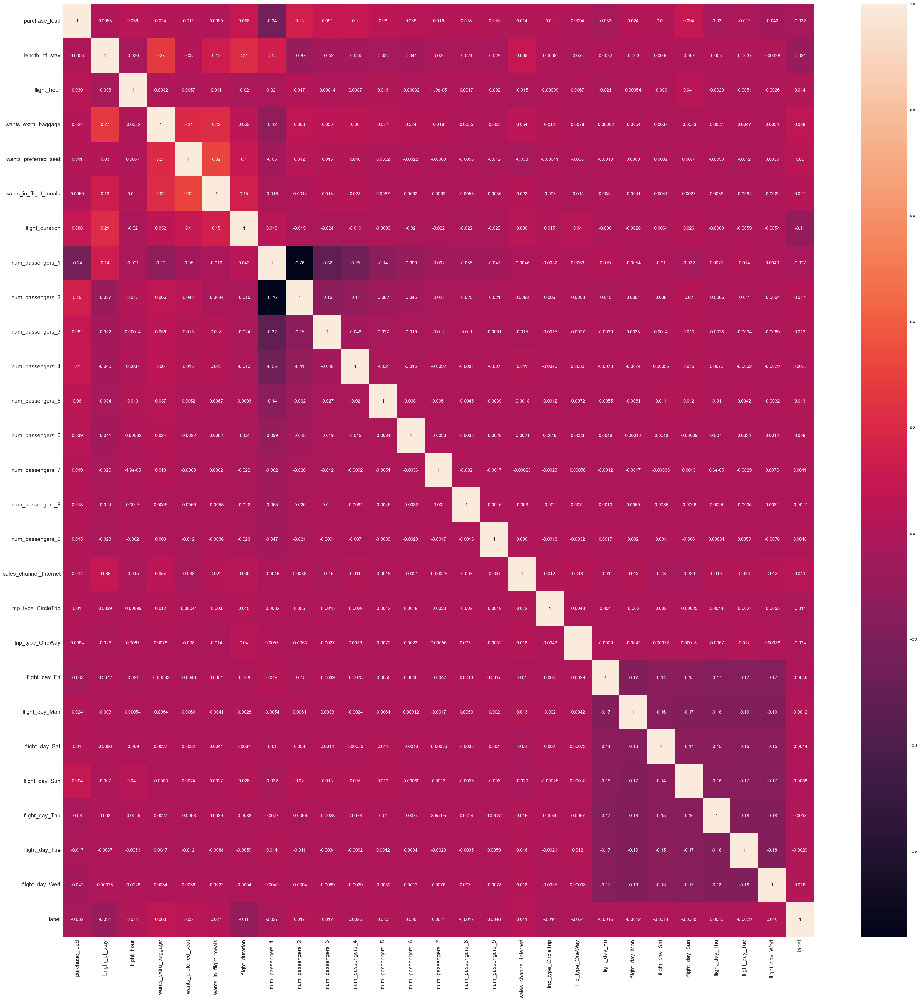

In [72]:
correlation = model_df.corr()
plt.figure(figsize=(45, 45))
sns.heatmap(
correlation, xticklabels=correlation.columns.values, yticklabels=correlation.columns.values, annot=True,
annot_kws={'size': 12}
)

plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()

In [73]:
def correlation (dataset, threshold):
    col_corr = set() 
    corr_matrix = dataset.corr()
    for i in range (len (corr_matrix.columns)) :
        for j in range(i):
            if abs (corr_matrix.iloc [i, j]) > threshold: 
                colname = corr_matrix.columns [i] 
                col_corr.add(colname)
    return col_corr

In [74]:
corr_features=correlation(X_train, 0.7)
len(set(corr_features))

1

In [76]:
feature_importances = pd.DataFrame({'features': X_train.columns,'importance': model3.feature_importances_}).sort_values(by='importance', ascending=True).reset_index()

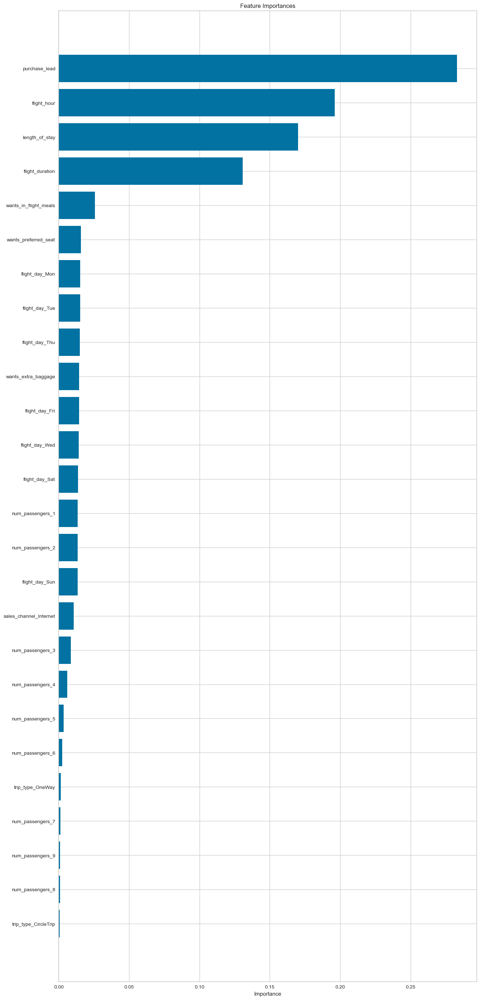

In [77]:
plt.figure(figsize=(15, 35))
plt.title('Feature Importances')
plt.barh(range(len(feature_importances)), feature_importances['importance'],color='b', align='center')
plt.yticks(range(len(feature_importances)), feature_importances['features']) 
plt.xlabel('Importance')
plt.show()

### num_passengers,purchase_lead,length_of_stay,flight_hour,flight_duration were the only features that showed corelation to completed booking

In [78]:
from imblearn.under_sampling import RandomUnderSampler

In [79]:
count_class_0, count_class_1=model_df.label.value_counts()
model_df_0=model_df[model_df['label']==0]
model_df_1=model_df[model_df['label']==1]

In [80]:
model_df_0_under=model_df_0.sample(count_class_1)
SampledDf=pd.concat([model_df_0_under,model_df_1], axis=0)
SampledDf.head(5)

,purchase_lead,length_of_stay,flight_hour,wants_extra_baggage,wants_preferred_seat,wants_in_flight_meals,flight_duration,num_passengers_1,num_passengers_2,num_passengers_3,...,trip_type_CircleTrip,trip_type_OneWay,flight_day_Fri,flight_day_Mon,flight_day_Sat,flight_day_Sun,flight_day_Thu,flight_day_Tue,flight_day_Wed,label
11778,1.568202,1.447158,0.301030,1,0,0,0.903090,True,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0
34542,2.152288,0.698970,0.845098,0,0,0,0.820858,True,False,False,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0
44778,1.944483,0.845098,0.301030,0,0,0,0.870404,True,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0
17798,1.913814,1.505150,1.041393,1,0,0,0.759668,True,False,False,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0
10186,1.812913,1.414973,1.230449,1,0,1,0.981366,True,False,False,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0


In [81]:
Y = SampledDf['label']
X = SampledDf.drop(columns=['num_passengers_1', 'num_passengers_2', 'label'])
X_train, X_tests, Y_train, Y_tests = train_test_split(X, Y, test_size=0.3, random_state=42)
print ('Train set:', X_train.shape,  Y_train.shape)
print ('Test set:', X_tests.shape,  Y_tests.shape)

Train set: (10469, 24) (10469,)
Test set: (4487, 24) (4487,)


In [82]:

model4 = RandomForestClassifier( n_estimators=100)
Y_pred_test = model_fit_predict(model4, X_train, Y_train, X_tests)


f1 =a round(f1_score(Y_tests, Y_pred_test),3) 


acc = round(accuracy_score(Y_tests, Y_pred_test),3) 

recall=round(recall_score(Y_tests, Y_pred_test, pos_label=0),3) 


pre = round(precision_score(Y_tests, Y_pred_test),3) 

print(f"Accuracy, precision, recall and f1-score for training data are {acc}, {pre},{recall} and {f1} respectively")

Accuracy, precision, recall and f1-score for training data are 0.61, 0.614,0.614 and 0.611 respectively


In [83]:
from sklearn import metrics
predictions1 = model4.predict(X_tests)
tn, fp, fn, tp = metrics.confusion_matrix(Y_tests, predictions1).ravel()
Y_tests.value_counts()



label
1    2257
0    2230
Name: count, dtype: int64

In [84]:

print(f"True positives: {tp}") 
print(f"False positives: {fp}") 
print(f"True negatives: {tn}") 
print(f"False negatives: {fn}\n")

print(f"Accuracy: {metrics.accuracy_score(Y_tests, predictions1)}") 
print(f"Precision: {metrics.precision_score(Y_tests, predictions1)}") 
print(f"Recall: {metrics.recall_score(Y_tests, predictions1)}")

True positives: 1370
False positives: 861
True negatives: 1369
False negatives: 887

Accuracy: 0.6104301314909739
Precision: 0.6140744060959211
Recall: 0.6070004430660169


0.999808959786035

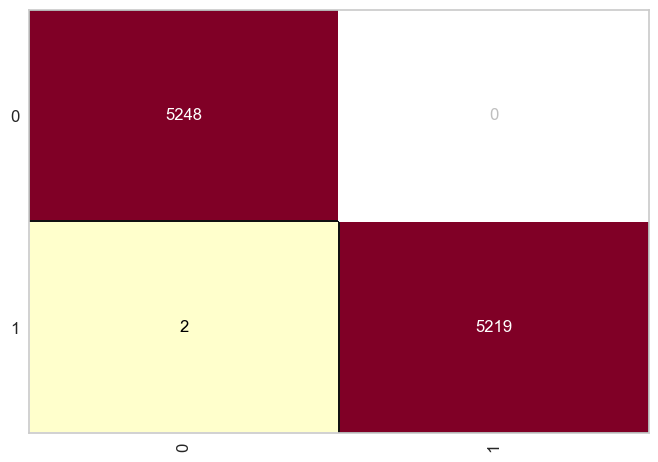

In [85]:
cm= ConfusionMatrix(model4, classes=[0,1])
cm.fit(X_train, Y_train)

cm.score(X_train, Y_train)

In [86]:
from sklearn.model_selection import GridSearchCV
classifier = ensemble.RandomForestClassifier(n_jobs=-1)
param_grid= {
    'n_estimators':[100,500,1000],
    'max_depth':[1,3,7,10],
    'criterion':["gini","entropy"],

}

model=GridSearchCV(
    estimator=classifier,
    param_grid=param_grid,
    scoring="accuracy",
    verbose=10,
    n_jobs=-1,
    cv=5,
)

model.fit(X_train,Y_train)
print(model.best_score_)
print(model.best_estimator_.get_params())

Fitting 5 folds for each of 24 candidates, totalling 120 fits
0.6379797396241896
{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': None, 'criterion': 'entropy', 'max_depth': 7, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 1000, 'n_jobs': -1, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}
[CV 1/5; 1/24] START criterion=gini, max_depth=1, n_estimators=100..............
[CV 1/5; 1/24] END criterion=gini, max_depth=1, n_estimators=100;, score=0.591 total time=   1.5s
[CV 1/5; 2/24] START criterion=gini, max_depth=1, n_estimators=500..............
[CV 1/5; 2/24] END criterion=gini, max_depth=1, n_estimators=500;, score=0.586 total time=   6.1s
[CV 5/5; 2/24] START criterion=gini, max_depth=1, n_estimators=500..............
[CV 5/5; 2/24] END criterion=gini, max_depth=1, n_estimators=500;, score=0.611 total tim

In [92]:
model5 = RandomForestClassifier(max_depth =7, n_jobs= -1, min_samples_split=2, n_estimators=1000)

Y_pred_test = model_fit_predict(model2, X_train, Y_train, X_tests)

f1 = round(f1_score(Y_tests, Y_pred_test),2) 

acc = round(accuracy_score(Y_tests, Y_pred_test),2) 

recall=round(recall_score(Y_tests, Y_pred_test, pos_label=0),2) 

pre = round(precision_score(Y_tests, Y_pred_test),2) 

print(f"Accuracy, precision and f1-score for training data are {acc}, {pre} and {f1} respectively")

Accuracy, precision and f1-score for training data are 0.61, 0.62 and 0.61 respectively
